### Декомпозиция
#### 1. Загрузим данные и изучим общую информацию
- ##### Откроем файл с данными и изучим общую информацию
- ##### Найдем кол-во пропусков и дубликатов

#### 2. Выполним предобработку данных
- ##### Работа с пропусками
- ##### Проверим на наличие неявных дубликатов

#### 3. Анализ данных
- ##### Исследуем количество объектов общественного питания по категориям: рестораны, кофейни, пиццерии, бары
- ##### Исследуем количество посадочных мест в местах по категориям: рестораны, кофейни, пиццерии, бары
- ##### Рассмотрим и изобразим соотношение сетевых и несетевых заведений в датасете
- ##### Посмотрим какие категории заведений чаще являются сетевыми
- ##### Найдем топ-15 популярных сетей в Москве
- ##### Отобразим общее количество заведений и количество заведений каждой категории по районам
- ##### Визуализируем распределение средних рейтингов по категориям заведений
- ##### Построим фоновую картограмму (хороплет) со средним рейтингом заведений каждого района
- ##### Отобразим все заведения датасета на карте с помощью кластеров
- ##### Найдем топ-15 улиц по количеству заведений
- ##### Найдем улицы, на которых находится только один объект общепита
- ##### Посчитаем медиану столбца middle_avg_bill для каждого района. Используем это значение в качестве ценового индикатора района. Построим фоновую картограмму (хороплет) с полученными значениями для каждого района

#### 4. Детализируем исследование: открытие кофейни
- ##### Посмотрим сколько всего кофеен в датасете, в каких районах их больше всего, каковы особенности их расположения
- ##### Посмотрим есть ли круглосуточные кофейни
- ##### Посмотрим какие у кофеен рейтинги и как они распределяются по районам
- ##### Посмотрим на какую стоимость чашки капучино стоит ориентироваться при открытии и почему

#### 5. Общий вывод
---

#### 1. Загрузим данные и изучим общую информацию

In [1]:
# Импортируем библиотеки
import pandas as pd
import numpy as np
import scipy.stats as stats
import math as mth
import plotly.express as px
import seaborn as sns
import folium
import plotly.io as pio
pio.renderers.default = "png"
from plotly import graph_objects as go
from matplotlib import pyplot as plt
from datetime import datetime, timedelta
from scipy import stats as st
from folium import Map, Choropleth, Marker
from folium.plugins import MarkerCluster

In [2]:
# Читаем файлы
try:
    df = pd.read_csv('datasets/moscow_places.csv')
    state_geo = 'datasets/admin_level_geomap.geojson'
except: 
    df = pd.read_csv('practicum_datasets/moscow_places.csv')
    state_geo = 'practicum_datasets/admin_level_geomap.geojson'

# Задаем настройки отображения
pd.set_option('display.max_columns', None)
pd.set_option('display.max_rows', None)
pd.set_option('display.max_colwidth', None)

##### Откроем файл с данными и изучим общую информацию

In [3]:
# Выводим первые 5 строк датасета
display(df.head(5))

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats
0,WoWфли,кафе,"Москва, улица Дыбенко, 7/1",Северный административный округ,"ежедневно, 10:00–22:00",55.878494,37.478860,5.0,NaN,NaN,NaN,NaN,0,NaN
1,Четыре комнаты,ресторан,"Москва, улица Дыбенко, 36, корп. 1",Северный административный округ,"ежедневно, 10:00–22:00",55.875801,37.484479,4.5,выше среднего,Средний счёт:1500–1600 ₽,1550.0,NaN,0,4.0
2,Хазри,кафе,"Москва, Клязьминская улица, 15",Северный административный округ,"пн-чт 11:00–02:00; пт,сб 11:00–05:00; вс 11:00–02:00",55.889146,37.525901,4.6,средние,Средний счёт:от 1000 ₽,1000.0,NaN,0,45.0
3,Dormouse Coffee Shop,кофейня,"Москва, улица Маршала Федоренко, 12",Северный административный округ,"ежедневно, 09:00–22:00",55.881608,37.488860,5.0,NaN,Цена чашки капучино:155–185 ₽,NaN,170.0,0,NaN
4,Иль Марко,пиццерия,"Москва, Правобережная улица, 1Б",Северный административный округ,"ежедневно, 10:00–22:00",55.881166,37.449357,5.0,средние,Средний счёт:400–600 ₽,500.0,NaN,1,148.0


In [4]:
# Выводим информацию датасета
display(df.info())

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 8406 entries, 0 to 8405
Data columns (total 14 columns):
 #   Column             Non-Null Count  Dtype  
---  ------             --------------  -----  
 0   name               8406 non-null   object 
 1   category           8406 non-null   object 
 2   address            8406 non-null   object 
 3   district           8406 non-null   object 
 4   hours              7870 non-null   object 
 5   lat                8406 non-null   float64
 6   lng                8406 non-null   float64
 7   rating             8406 non-null   float64
 8   price              3315 non-null   object 
 9   avg_bill           3816 non-null   object 
 10  middle_avg_bill    3149 non-null   float64
 11  middle_coffee_cup  535 non-null    float64
 12  chain              8406 non-null   int64  
 13  seats              4795 non-null   float64
dtypes: float64(6), int64(1), object(7)
memory usage: 919.5+ KB


None

- столбцы category, address, district, hours, price, avg_bill - тип object
- столбцы lat, lng, rating, middle_avg_bill, middle_coffee_cup, seats - тип float
- столбцы chain - тип int

##### Найдем кол-во пропусков и дубликатов

In [5]:
# Выводим кол-во пропусков
display(df.isna().sum())

name                    0
category                0
address                 0
district                0
hours                 536
lat                     0
lng                     0
rating                  0
price                5091
avg_bill             4590
middle_avg_bill      5257
middle_coffee_cup    7871
chain                   0
seats                3611
dtype: int64

In [6]:
# Выводим кол-во дубликатов
display(df.duplicated().sum())

0

**Вывод:**
- В датасете представлено 8406 заведения. 
- По типу данных нареканий нет, за исключением столбца seats. Дробную часть следует убрать.
- Видно значительное кол-во пропусков в столбцах middle_coffee_cup, middle_avg_bill, avg_bill, price, seats.
- Явных дубликатов - 0

#### 2. Выполним предобработку данных
##### Работа с пропусками

- hours - нецелесообразно заменять средним значением т.к. даже рестораны одной сети могут работать в разное время суток
- price, avg_bill - заменим заглушкой 
- middle_avg_bill - потребуется для анализа, трогать не будем
- seats, middle_coffee_cup - заменим заглушкой (-1) для дальнейших расчётов

In [7]:
# Заменим пропущенные значения
# В столбце price заменим заглушкой N/a
df['price'].fillna("N/a",inplace=True)

# В столбце avg_bill заменим заглушкой N/a
df['avg_bill'].fillna("N/a",inplace=True)

# В столбце seats заменим заглушкой (-1)
df['seats'].fillna(-1,inplace=True)

# Меняем тип данных
df['seats'] = df['seats'].astype('int')

# В столбце middle_coffee_cup заменим заглушкой (-1)
df['middle_coffee_cup'].fillna(-1,inplace=True)

In [8]:
# Создадим столбец id в качестве маркера
df['id'] = df.reset_index().index

In [9]:
# Создадим столбец street в котором сохраним название улиц
words = ['улица','ул','переулок','шоссе','проспект','площадь','проезд',
         'село','аллея','бульвар','набережная','тупик','линия']

str_pat = r".*,\s*\b([^,]*?(?:{})\b[^,]*)[,$]+".format("|".join(words))

df["street"] = df["address"].str.extract(str_pat)

In [10]:
# Создадим столбец is_24/7 в котором сохраним булево значение круглосуточной работы 
df['is_24'] = df['hours'] == 'ежедневно, круглосуточно'

# Выводим первые 5 строк столбца
display(df['is_24'].head())

0    False
1    False
2    False
3    False
4    False
Name: is_24, dtype: bool

##### Проверим на наличие неявных дубликатов

Проверим столбцы name, category, district на неявные дубликаты

In [11]:
# Выводим список заведений
df.groupby('name').agg({'id': 'nunique'}).sort_values(by='name', ascending=True).reset_index().head(10)

,name,id
0,#КешбэкКафе,1
1,+39 Pizzeria Mozzarella bar,1
2,1 Этаж,1
3,1-я Креветочная,1
4,10 Идеальных Пицц,3
5,1001 Ночь,1
6,100ловая,1
7,100лоффка,1
8,13,1
9,13 Chef doner,1


- "Доминос пицца" и "Домино'с пицца"
- "ЯНДЕКС.ЛАВКА" и "ЯНДЕКС ЛАВКА"
- "Домик в саду" и "Домик в Саду"
- "Cofe Fest" и "CofeFest"
- "Deli2go" и "Deli2Go"
- "Di Villaggio" и "Di villaggio"
- "Drive Cafe" и "Drive Café"


In [12]:
# Заменяем названия для дубликатов
df['name'] = df['name'].replace("Домик в саду", "Домик в Саду") 
df['name'] = df['name'].replace("Cofe Fest", "CofeFest")
df['name'] = df['name'].replace("Deli2go", "Deli2Go")
df['name'] = df['name'].replace("Di Villaggio", "Di villaggio")
df['name'] = df['name'].replace("Drive Cafe", "Drive Café")
df['name'] = df['name'].replace("Доминос пицца", "Домино'с пицца")
df['name'] = df['name'].replace("ЯНДЕКС ЛАВКА", "ЯНДЕКС.ЛАВКА")
df['name'] = df['name'].replace("Домино'с", "Домино'с пицца")        
df['name'] = df['name'].replace("WILD BEAN", "WILD BEAN CAFE")  

In [13]:
# Выводим список категорий заведений
display(df['category'].unique())

array(['кафе', 'ресторан', 'кофейня', 'пиццерия', 'бар,паб',
       'быстрое питание', 'булочная', 'столовая'], dtype=object)

Дубликатов не обнаружено

In [14]:
# Выводим список округов
display(df['district'].unique())

array(['Северный административный округ',
       'Северо-Восточный административный округ',
       'Северо-Западный административный округ',
       'Западный административный округ',
       'Центральный административный округ',
       'Восточный административный округ',
       'Юго-Восточный административный округ',
       'Южный административный округ',
       'Юго-Западный административный округ'], dtype=object)

Дубликатов не обнаружено

- Создан столбец street с названиями улиц из столбца с адресом.
- Создан столбец is_24/7 с обозначением, что заведение работает ежедневно и круглосуточно (24/7)
- Пропуски заменены на соответствующие значения
- Обработаны неявные дубликаты

#### 3. Анализ данных

##### Исследуем количество объектов общественного питания по категориям: рестораны, кофейни, пиццерии, бары

In [15]:
# Построим таблицу категорий заведений
category_type = (df.groupby('category').agg(count=('id','count')).reset_index()
                 .sort_values('count', ascending=False))

# Добавим столбец % соотношения
category_type['percent'] = round(category_type['count'] / sum(category_type['count']) * 100, 2)
category_type.sort_values(by='percent', ascending=False)

# Выводим таблицу
display(category_type)

,category,count,percent
3,кафе,2378,28.29
6,ресторан,2043,24.30
4,кофейня,1413,16.81
0,"бар,паб",765,9.10
5,пиццерия,633,7.53
2,быстрое питание,603,7.17
7,столовая,315,3.75
1,булочная,256,3.05


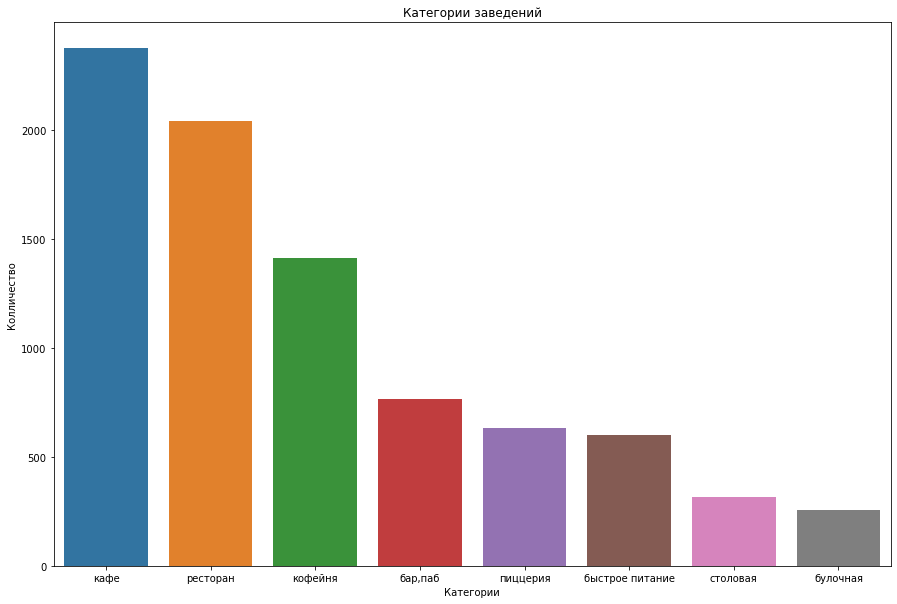

In [16]:
# Строим график
plt.figure(figsize=(15, 10))
ax = sns.barplot(x='category', y='count', data=category_type)
ax.set_title('Категории заведений')
ax.set_xlabel('Категории') 
ax.set_ylabel('Колличество')
plt.show()

- кафе - 28%
- ресторан - 24%
- кофейня - 17%
- бар,паб - 9%
- пиццерия - 7,5%
- быстрое питание - 7%
- столовая - 4%
- булочная - 3%

Кафе и ресторанов более 2000 заведений, кофеин - почти 1500, бар,паб, пиццерия, быстрое питание, столовая, булочная - менее 1000 заведений.

##### Исследуем количество посадочных мест в местах по категориям: рестораны, кофейни, пиццерии, бары

In [17]:
# Фильтруем датасет
df = df.query('seats > 0')

# Выведем распределение
display(df['seats'].describe())

# Выведем 90, 95, 99 персентиль
print(f'90, 95, 99 персентиль:', np.percentile(df['seats'], [90, 95, 99]))

count    4659.000000
mean      111.586607
std       123.188197
min         1.000000
25%        40.000000
50%        79.000000
75%       143.000000
max      1288.000000
Name: seats, dtype: float64

90, 95, 99 персентиль: [250. 320. 625.]


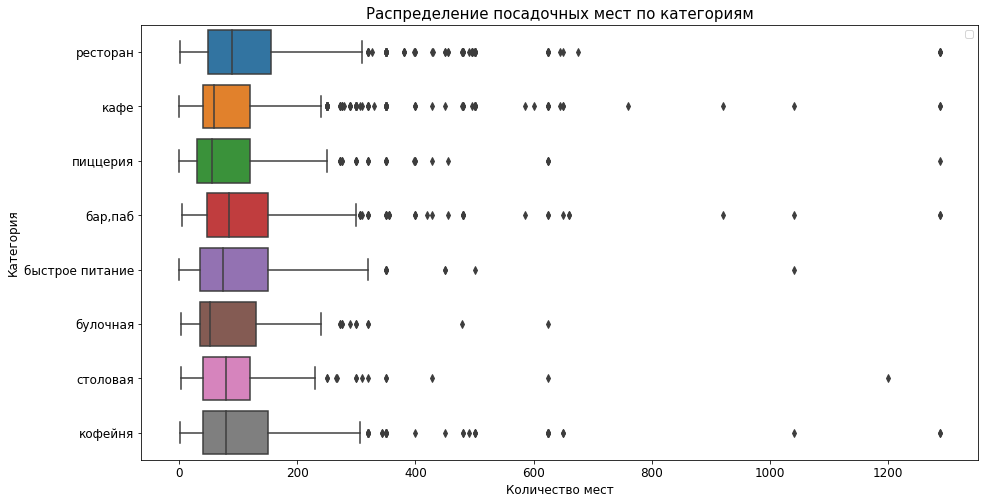

In [18]:
# Строим график
plt.figure(figsize=(15,8))
sns.boxplot(data=df, x="seats", y="category", hue="category", dodge=False)
plt.title('Распределение посадочных мест по категориям', fontsize = 15)
plt.xlabel('Количество мест', fontsize = 12)
plt.ylabel('Категория', fontsize = 12)
plt.legend('')
plt.yticks(fontsize=12)
plt.xticks(fontsize=12)
plt.show()

- В среднем мы видим 79 мест на заведение
- Лидируют категории - быстрое питание, кофейня, ресторан
- Меньше всего мест в столовых и кафе
- 95% заведений имеют не более 320 мест, все что находиться за ределами - можно считать выбросами

##### Рассмотрим и изобразим соотношение сетевых и несетевых заведений в датасете

,chain,count,percent
0,0,2782,59.71
1,1,1877,40.29


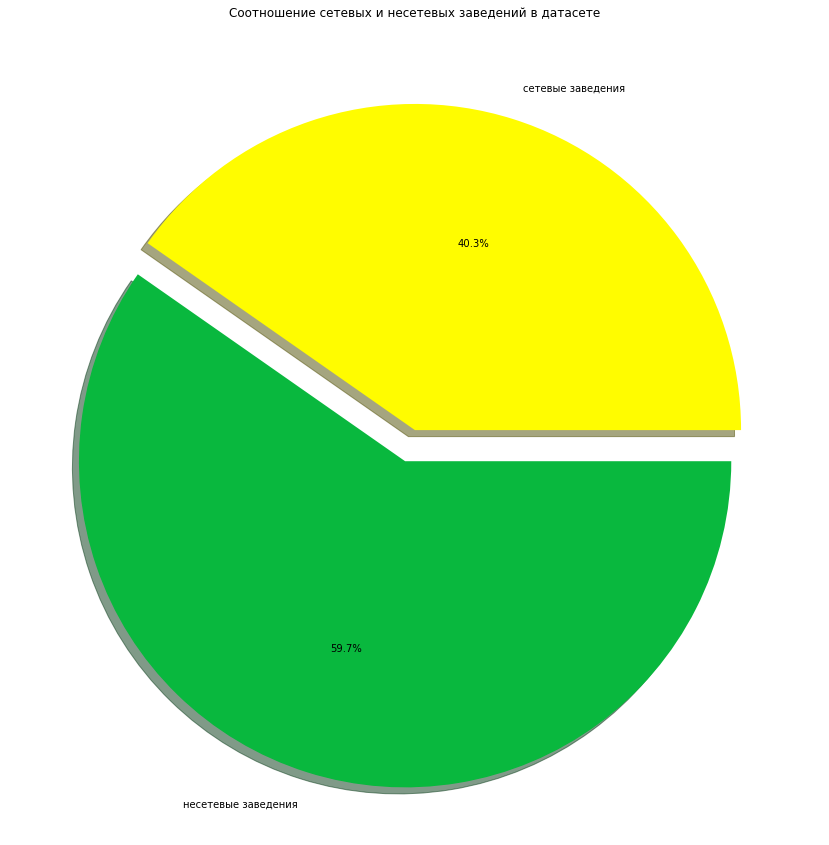

In [19]:
# Строим таблицу
chain_category = df.groupby('chain').agg(count=('id','count')).reset_index()

# Добавим столбец % соотношения
chain_category['percent'] = round(chain_category['count']/chain_category['count'].sum()*100, 2)
display(chain_category)

# Строим график
plt.figure(figsize=(15, 15))
colors = ['#09B83E', '#FFFC00']
explode = (0.1, 0)
plt.pie(chain_category['count'],
        labels=chain_category['chain'].map({1: 'сетевые заведения', 0: 'несетевые заведения'}), 
        colors=colors,
        explode=explode, 
        autopct='%1.1f%%',
        counterclock=False, 
        shadow=True)
plt.title('Соотношение сетевых и несетевых заведений в датасете')
plt.show()

- 59,7% отдельные заведения
- 40,3% заведений являются сетевыми

##### Посмотрим какие категории заведений чаще являются сетевыми

In [20]:
# Строим таблицу
chain_type = df.groupby('category').agg({'chain' : 'sum', 'id' : 'count'}).reset_index()
chain_type.columns = ['category', 'chain_count', 'total_count']

# Добавим столбец % соотношения
chain_type['percent'] = round(chain_type['chain_count'] / chain_type['total_count'] * 100, 2)
chain_type = chain_type.sort_values(by='percent')

# Выводим таблицу
display(chain_type)

,category,chain_count,total_count,percent
0,"бар,паб",109,464,23.49
7,столовая,44,159,27.67
3,кафе,415,1174,35.35
6,ресторан,454,1250,36.32
2,быстрое питание,124,331,37.46
4,кофейня,399,727,54.88
5,пиццерия,243,417,58.27
1,булочная,89,137,64.96


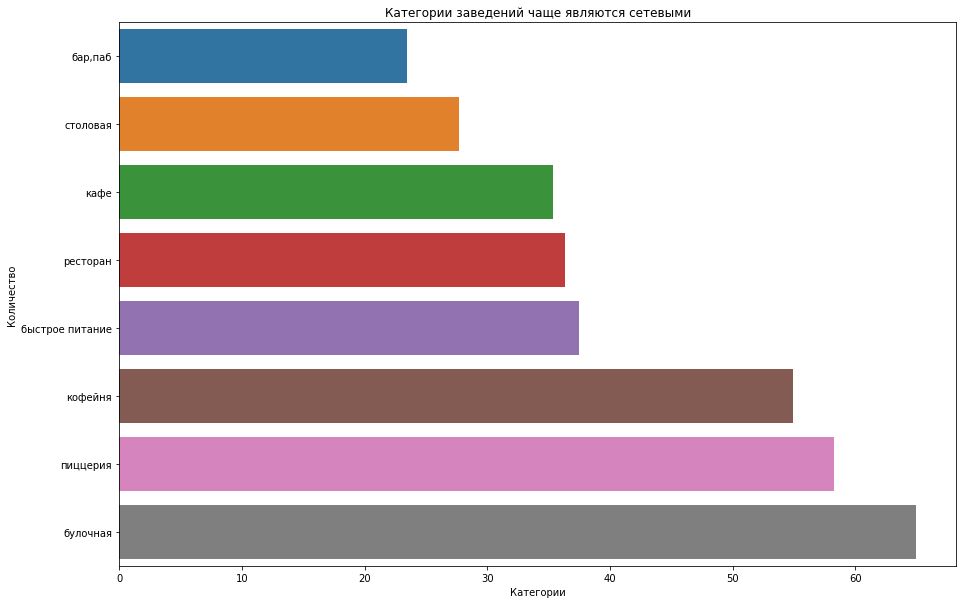

In [21]:
# Строим график
plt.figure(figsize=(15, 10))
ax = sns.barplot(x='percent', y='category', data=chain_type)
ax.set_title('Категории заведений чаще являются сетевыми')
ax.set_xlabel('Категории') 
ax.set_ylabel('Количество')
plt.show()

Чаще всего сетевыми являются категории:
- булочная (64,96%)
- пиццерия (58,27%)
- кофейня (54,88%)

##### Найдем топ-15 популярных сетей в Москве

In [22]:
# Создадим таблицу top с топ 15 заведениями по категориям
top = df.query('chain == 1').groupby(
    ['category','name']).agg({'id': 'nunique'}).sort_values(
    by=['id', 'category'], ascending=False).reset_index().head(15)

top = top.groupby('category').agg({'id': 'sum'}).reset_index()
top = top.reset_index(drop=True)

# Выводим таблицу
display(top)

,category,id
0,булочная,32
1,кафе,27
2,кофейня,207
3,пиццерия,121
4,ресторан,114


In [23]:
# Создадим таблицу category_by_coffe с общим кол-вом заведений по категориям
category_by_coffe = df.groupby('category').agg({'id': 'count'}).reset_index()

# Соединим таблицы и найдем отношение топ заведений к общему числу по категориям
coffe_shop = pd.merge(category_by_coffe, top, on='category', how='left')
coffe_shop = coffe_shop.fillna(0)
coffe_shop['id_y'] = coffe_shop['id_y'].astype(int)
coffe_shop['percent'] = round(coffe_shop['id_y']/coffe_shop['id_x'] * 100, 2)
coffe_shop.columns = ['category', 'total_count', 'shop_count', 'percent']
coffe_shop = coffe_shop.sort_values(by='total_count', ascending=False)

# Выводим таблицу
display(coffe_shop)

,category,total_count,shop_count,percent
6,ресторан,1250,114,9.12
3,кафе,1174,27,2.30
4,кофейня,727,207,28.47
0,"бар,паб",464,0,0.00
5,пиццерия,417,121,29.02
2,быстрое питание,331,0,0.00
7,столовая,159,0,0.00
1,булочная,137,32,23.36


Видим большое кол-во заведений сетей:
- Шоколадница (82)
- Додо Пицца (61)
- Домино'с Пицца (60)
 
Это три самые большие сети в Москве

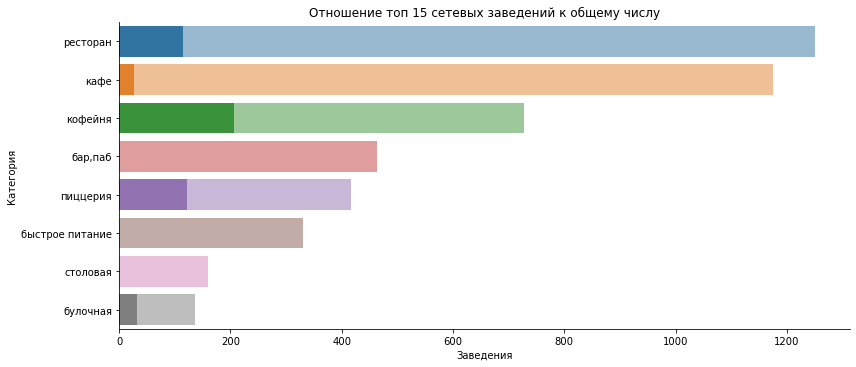

In [24]:
# Строим график
ax = sns.catplot(data=coffe_shop, kind="bar", x="shop_count", y="category", alpha=1, aspect=12/5)
ax1 = sns.barplot(x='total_count', y='category', data=coffe_shop, alpha=0.5)
ax.set_axis_labels('Заведения', 'Категория')
plt.title('Отношение топ 15 сетевых заведений к общему числу')
plt.show()

По категориям из топа 15 популярных заведений в Москве, наибольшее процентное отношение имеют категории:
- пиццерия (29.02%)
- кофейня (28.47%)
- булочная (23.36%)
- ресторан (9.12%)
- кафе (2.3%)

##### Отобразим общее количество заведений и количество заведений каждой категории по районам

In [25]:
# Строим таблицу кол-ва заведений в разбивке по округам
district = df.groupby('district').agg({'id': 'nunique'}).sort_values(by='id', ascending=False).reset_index()

# Выводим таблицу
display(district)

,district,id
0,Центральный административный округ,1174
1,Северный административный округ,572
2,Южный административный округ,534
3,Северо-Восточный административный округ,492
4,Западный административный округ,476
5,Юго-Западный административный округ,439
6,Восточный административный округ,396
7,Юго-Восточный административный округ,324
8,Северо-Западный административный округ,252


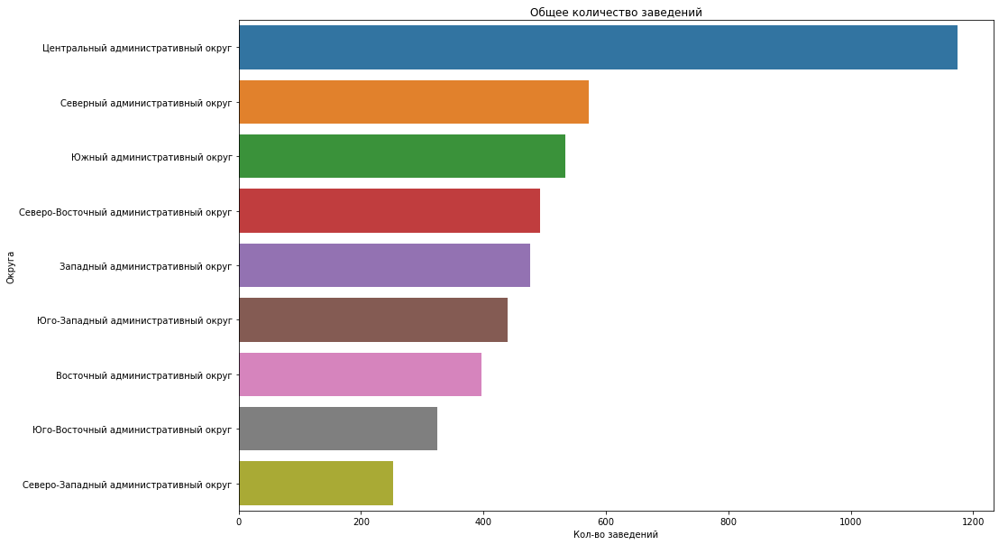

In [26]:
# Строим график
plt.figure(figsize=(15, 10))
ax = sns.barplot(x='id', y='district', data=district)
ax.set_title('Общее количество заведений')
ax.set_xlabel('Кол-во заведений') 
ax.set_ylabel('Округа')
plt.show()

В датасете присутствуют:
- ЦАО (1174 заведения)
- САО (572 заведения)
- ЮАО (534 заведения)
- СВАО (492 заведения)
- ЗАО (476  заведения)
- ЮЗАО (439 заведений)
- ВАО (396 заведений)
- ЮВАО (324 заведения)
- СЗАО (252 заведения)

In [27]:
# Строим таблицу кол-ва заведений в разбивке по округам и категорий заведений
district_category = df.groupby(['district', 'category']).agg(
    count_places = ('name','count')).reset_index().sort_values(by=['category', 'count_places'])

# Выводим таблицу
display(district_category.head())

,district,category,count_places
32,Северо-Западный административный округ,"бар,паб",21
48,Юго-Восточный административный округ,"бар,паб",22
8,Западный административный округ,"бар,паб",30
56,Юго-Западный административный округ,"бар,паб",31
0,Восточный административный округ,"бар,паб",34


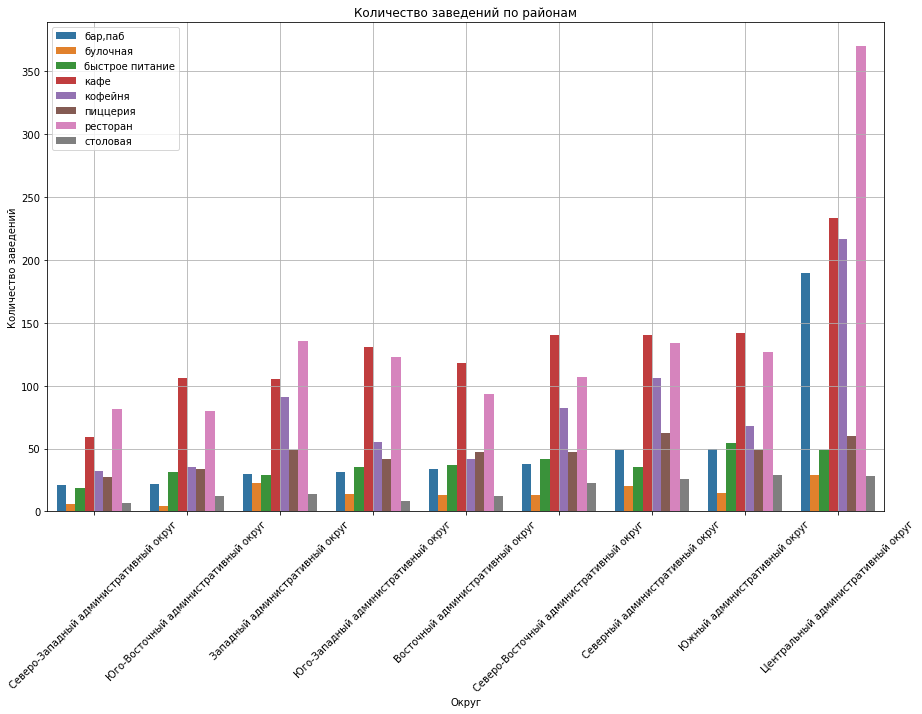

In [28]:
# Выводим график
plt.figure(figsize=(15,9))
sns.barplot(x='district', y='count_places', data=district_category, hue='category')
plt.title('Количество заведений по районам')
plt.xlabel('Округ')
plt.ylabel('Количество заведений')
plt.xticks(rotation=45)
plt.legend(loc='upper left', fontsize=10)
plt.grid()
plt.show()

- Из графиков можно отметить, в ЦАО заметно больше заведений типа: бар, кафе, кофейня, ресторан.
- Обратная ситуация у СЗАО и ЮВАО
- по остальным округам ситуация +- одинаковая

##### Визуализируем распределение средних рейтингов по категориям заведений

In [29]:
# Строим таблицу рейтинга заведений в разбивке по категориям
rating = df.groupby('category').agg({'rating': 'mean'}).sort_values(by='rating', ascending=False).reset_index()
rating.columns = ['category','rating']

# Выводим таблицу
display(rating)

,category,rating
0,"бар,паб",4.385560
1,ресторан,4.291600
2,булочная,4.290511
3,кофейня,4.284319
4,пиццерия,4.283693
5,столовая,4.241509
6,кафе,4.151959
7,быстрое питание,4.049547


В среднем рейтинг заведений одинаковый

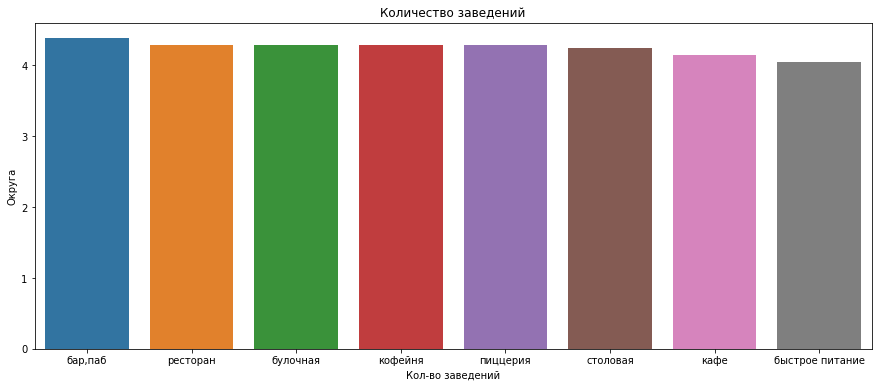

In [30]:
# Строим график
plt.figure(figsize=(15, 6))
ax = sns.barplot(x='category', y='rating', data=rating)
ax.set_title('Количество заведений')
ax.set_xlabel('Кол-во заведений') 
ax.set_ylabel('Округа')
plt.show()

Рейтинг всех заведений примерно одинаковый. 
Лидерами являются бар/паб, а отстающими - быстрое питание.

##### Построим фоновую картограмму (хороплет) со средним рейтингом заведений каждого района

In [31]:
# Задаем координаты
moscow_lat, moscow_lng = 55.751244, 37.618423

# создаём карту Москвы
m = Map(location=[moscow_lat, moscow_lng], zoom_start=10)

Choropleth(
    geo_data=state_geo,
    data=df['rating'],
    columns=['district', 'rating'],
    key_on='feature.name',
    fill_color='YlGn',
    fill_opacity=0.2,
    legend_name='Медианный рейтинг заведений по районам',
).add_to(m)

# Выводим график
display(m)

##### Отобразим все заведения датасета на карте с помощью кластеров

In [32]:
# Задаем параметры
moscow_lat, moscow_lng = 55.751244, 37.618423
m = Map(location=[moscow_lat, moscow_lng], zoom_start=10)
marker_cluster = MarkerCluster().add_to(m)

# Задаем функцию для формирования кластеров
def create_clusters(row):
    Marker(
        [row['lat'], row['lng']],
        popup=f"{row['name']} {row['rating']}",
    ).add_to(marker_cluster)

df.apply(create_clusters, axis=1)

# Выводим график
display(m)

##### Найдем топ-15 улиц по количеству заведений

In [33]:
display(df.head(5))

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats,id,street,is_24
1,Четыре комнаты,ресторан,"Москва, улица Дыбенко, 36, корп. 1",Северный административный округ,"ежедневно, 10:00–22:00",55.875801,37.484479,4.5,выше среднего,Средний счёт:1500–1600 ₽,1550.0,-1.0,0,4,1,улица Дыбенко,False
2,Хазри,кафе,"Москва, Клязьминская улица, 15",Северный административный округ,"пн-чт 11:00–02:00; пт,сб 11:00–05:00; вс 11:00–02:00",55.889146,37.525901,4.6,средние,Средний счёт:от 1000 ₽,1000.0,-1.0,0,45,2,Клязьминская улица,False
4,Иль Марко,пиццерия,"Москва, Правобережная улица, 1Б",Северный административный округ,"ежедневно, 10:00–22:00",55.881166,37.449357,5.0,средние,Средний счёт:400–600 ₽,500.0,-1.0,1,148,4,Правобережная улица,False
6,Огни города,"бар,паб","Москва, Клязьминская улица, 9, стр. 3",Северный административный округ,пн 15:00–04:00; вт-вс 15:00–05:00,55.890752,37.524653,4.4,средние,Средний счёт:199 ₽,199.0,-1.0,0,45,6,Клязьминская улица,False
7,Mr. Уголёк,быстрое питание,"Москва, Клязьминская улица, 9, стр. 3",Северный административный округ,"пн-чт 10:00–22:00; пт,сб 10:00–23:00; вс 10:00–22:00",55.890636,37.524303,4.7,средние,Средний счёт:200–300 ₽,250.0,-1.0,0,45,7,Клязьминская улица,False


In [34]:
# Строим таблицу топ 10 улиц по кол-ву заведений 
street = df.groupby('street').agg({'id' : 'count'}).sort_values('id', ascending=False).head(10).reset_index()

# Выводим таблицу
display(street)  

,street,id
0,проспект Мира,89
1,Профсоюзная улица,86
2,Ленинский проспект,80
3,Ленинградский проспект,76
4,проспект Вернадского,69
5,Дмитровское шоссе,55
6,Каширское шоссе,53
7,улица Миклухо-Маклая,47
8,Люблинская улица,39
9,Варшавское шоссе,39


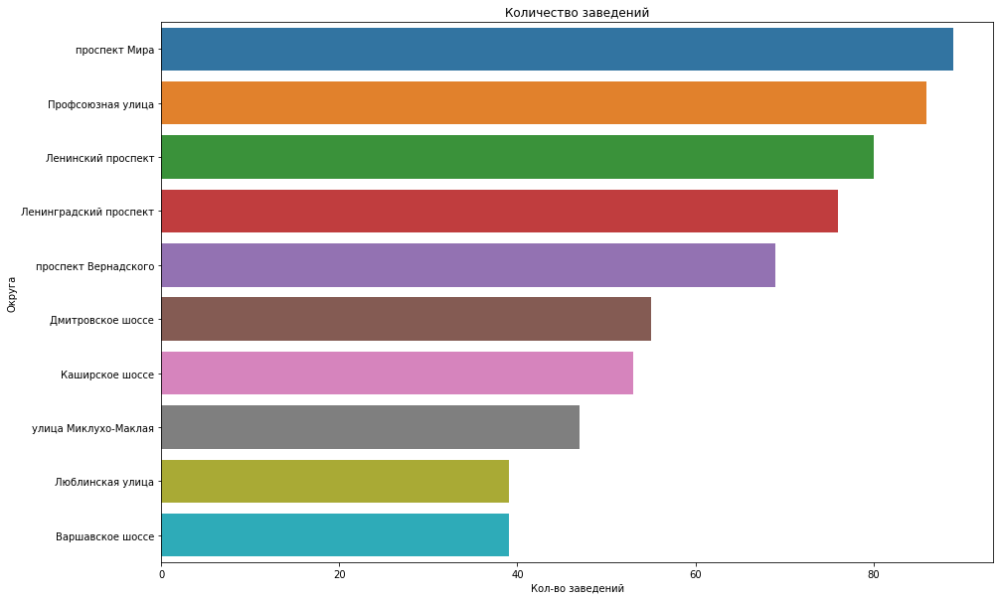

In [35]:
# Строим график
plt.figure(figsize=(15, 10))
ax = sns.barplot(x='id', y='street', data=street)
ax.set_title('Количество заведений')
ax.set_xlabel('Кол-во заведений') 
ax.set_ylabel('Округа')
plt.show()

Больше всего заведений на улицах:
- проспект Мира (89)
- Профсоюзная улица (86)
- Ленинский проспект (80)

Меньше всего на Люблинская улица и Варшавское шоссе (39)

In [36]:
# Создаем список названий улиц
streets = street['street'].tolist()

# Создаем отфильтрованный датасет streets_by_category с улицами из списка
streets_by_category = df.query('street in @streets')

# Выводим таблицу
display(streets_by_category.head())

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats,id,street,is_24
8,Donna Maria,ресторан,"Москва, Дмитровское шоссе, 107, корп. 4",Северный административный округ,"ежедневно, 10:00–22:00",55.880045,37.539006,4.8,средние,Средний счёт:от 500 ₽,500.0,-1.0,0,79,8,Дмитровское шоссе,False
57,Мир пиццы,кафе,"Москва, Дмитровское шоссе, 151, корп. 5",Северный административный округ,"ежедневно, 09:00–02:00",55.896323,37.540918,4.2,N/a,N/a,NaN,-1.0,0,46,57,Дмитровское шоссе,False
89,Сахарочек,кофейня,"Москва, Дмитровское шоссе, 107А, корп. 2",Северный административный округ,пн-пт 09:00–22:00; сб 10:00–22:00; вс 10:00–21:00,55.879256,37.538444,4.5,средние,Цена чашки капучино:100–200 ₽,NaN,150.0,0,120,89,Дмитровское шоссе,False
92,ЛавашОК,быстрое питание,"Москва, Дмитровское шоссе, 116Д",Северо-Восточный административный округ,"ежедневно, 10:00–22:00",55.901597,37.547348,4.3,средние,Средний счёт:250–600 ₽,425.0,-1.0,1,120,92,Дмитровское шоссе,False
93,Jamamai asian kitchen & bar,ресторан,"Москва, Дмитровское шоссе, 107, корп. 2",Северный административный округ,"ежедневно, 11:00–23:00",55.878926,37.542381,4.3,высокие,Средний счёт:2100 ₽,2100.0,-1.0,0,120,93,Дмитровское шоссе,False


In [37]:
# Группируем кол-во заведений и категорий по улицам
ca_street = streets_by_category.groupby(['street', 'category']).agg(
    count = ('id','count')).reset_index().sort_values(by=['category', 'count'])

# Выводим таблицу
display(ca_street.head())

,street,category,count
15,Каширское шоссе,"бар,паб",2
68,улица Миклухо-Маклая,"бар,паб",3
0,Варшавское шоссе,"бар,паб",4
7,Дмитровское шоссе,"бар,паб",4
38,Люблинская улица,"бар,паб",4


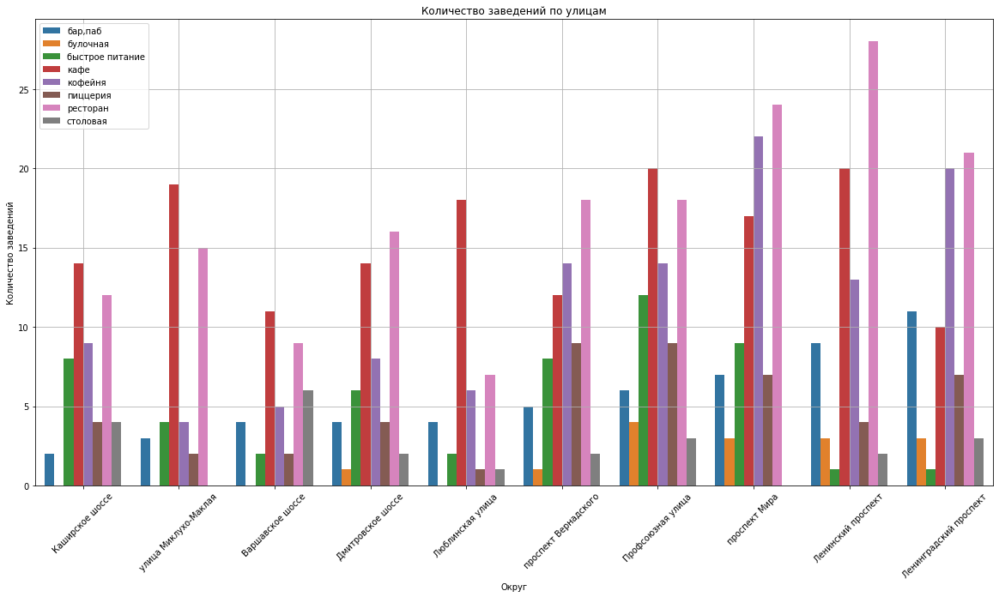

In [38]:
# Строим график
plt.figure(figsize=(20,10))
sns.barplot(x='street', y='count', data=ca_street, hue='category')
plt.title('Количество заведений по улицам')
plt.xlabel('Округ')
plt.ylabel('Количество заведений')
plt.xticks(rotation=45)
plt.legend(loc='upper left', fontsize=10)
plt.grid()
plt.show()

Категории заведений расположены неравномерно по улицам. В зависимости от места, можно наблюдать различную концентрацию типов заведений. 
Практически на всех улицах мы видим преимущественно рестораны и кафе. Это самые распространенные категории на этих участках.

##### Найдем улицы, на которых находится только один объект общепита

In [39]:
# Создаем таблицу с 1 заведениям
single = df.groupby('street').agg({'id': 'count'}).sort_values(by='id', ascending=False)
single = single.query('id == 1').reset_index()

# Выводим таблицу
display(single.head())

,street,id
0,Боровское шоссе,1
1,Левобережная улица,1
2,улица Корнейчука,1
3,Лазаревский переулок,1
4,Боровая улица,1


In [40]:
# Выводим общую информацию
print('Всего улиц:', df['street'].nunique())
print('Улицы с единственным объектом общественного питания:', single['id'].sum())
print('Процентное отношение:', round(single['id'].sum()/df['street'].nunique(), 2))

Всего улиц: 920
Улицы с единственным объектом общественного питания: 315
Процентное отношение: 0.34


Всего 315 улиц с одним общепитом, в процентном соотношении от всего кол-ва улиц - 0,34 % 

In [41]:
# Создаем таблицу с наибольшим кол-вом заведений
one_id = single['street'].tolist()
category_by_one_id = df.query('street == @one_id').groupby('district').agg(
    {'id': 'nunique'}).reset_index().sort_values(by='id')

# Выводим таблицу
display(category_by_one_id)

,district,id
7,Юго-Западный административный округ,12
4,Северо-Западный административный округ,18
1,Западный административный округ,26
6,Юго-Восточный административный округ,27
0,Восточный административный округ,28
8,Южный административный округ,31
3,Северо-Восточный административный округ,34
2,Северный административный округ,36
5,Центральный административный округ,103


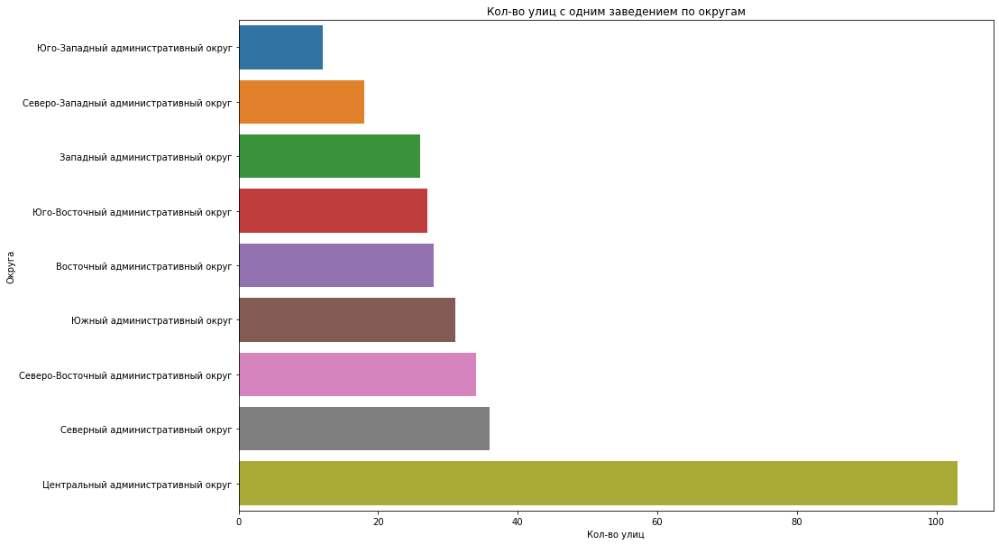

In [42]:
plt.figure(figsize=(15, 10))
ax = sns.barplot(x='id', y='district', data=category_by_one_id)
ax.set_title('Кол-во улиц с одним заведением по округам')
ax.set_xlabel('Кол-во улиц') 
ax.set_ylabel('Округа')
plt.show()

Больше всего улиц с одним заведением в ЦАО (103). Скорее всего это обусловлено тем, что в центре большое кол-во заведений, которые встречаются достаточно часто.

##### Посчитаем медиану столбца middle_avg_bill для каждого района. Используем это значение в качестве ценового индикатора района. Построим фоновую картограмму (хороплет) с полученными значениями для каждого района

In [43]:
# Строим таблицу с средним чекам в разрезе по округам
data_by_middle_avg_bill = df.groupby('district').agg({'middle_avg_bill': 'median'})\
.sort_values(by='middle_avg_bill', ascending=False).reset_index().head(15)
data_by_middle_avg_bill.columns = ['district','median_avg_bill']

# Выводим таблицу
display(data_by_middle_avg_bill)

,district,median_avg_bill
0,Западный административный округ,1000.0
1,Центральный административный округ,1000.0
2,Северо-Западный административный округ,750.0
3,Восточный административный округ,700.0
4,Юго-Западный административный округ,675.0
5,Северный административный округ,650.0
6,Южный административный округ,550.0
7,Северо-Восточный административный округ,500.0
8,Юго-Восточный административный округ,500.0


In [44]:
# Строим хороплет
Choropleth(
    geo_data=state_geo,
    data=data_by_middle_avg_bill['median_avg_bill'],
    columns=['district', 'median_avg_bill'],
    key_on='feature.name',
    fill_color='YlGn',
    fill_opacity=0.1,
    legend_name='Средний чек заведений по районам').add_to(m)

# Выводим график
display(m)

Можно сделать вывод: чем дальше от центра, тем меньше медианный средний чек. 

**Вывод:** В датасете представлено 8406 заведений. 

Из них по категориям:
- кафе - 28%
- ресторан - 24%
- кофейня - 17%
- бар,паб - 9%
- пиццерия - 7,5%
- быстрое питание - 7%
- столовая - 4%
- булочная - 3%

кафе и ресторанов более 2000 заведений, кофейни - почти 1500, бар,паб, пиццерия, быстрое питание, столовая, булочная - менее 1000 заведений.

По сетям:
- 59,7% отдельные заведения
- 40,3% заведений являются сетевыми

Чаще всего сетевыми являются категории:
- булочная (64,96%)
- пиццерия (58,27%)
- кофейня (54,88%)

Лидеры по сетям являются:
- Шоколадница
- Додо Пицца
- Домино'с Пицца
- One Price Coffee

Данные категории относятся к кофейням и пиццериям

В кол-во заведений по округам:
- ЦАО (1174 заведения)
- САО (572 заведения)
- ЮАО (534 заведения)
- СВАО (492 заведения)
- ЗАО (476  заведения)
- ЮЗАО (439 заведений)
- ВАО (396 заведений)
- ЮВАО (324 заведения)
- СЗАО (252 заведения)

Больше всего заведений на улицах:
- проспект Мира (89)
- Профсоюзная улица (86)
- Ленинский проспект (80)

Меньше всего на Люблинская улица и Варшавское шоссе (39)

Всего 315 улиц с одним общепитом, в процентном соотношении от всего кол-ва улиц - 0,34 % 

Удаленность от центра влияет на медиану среднего чека.

#### 4. Детализируем исследование: открытие кофейни

##### Посмотрим сколько всего кофеен в датасете, в каких районах их больше всего, каковы особенности их расположения

In [45]:
# Создаем датасет с кофейнями
coffe = df.query('category == "кофейня"').reset_index()

# Выводим кол-во кофеин
display(coffe['id'].nunique())

727

В датасете 727 кофеен

In [46]:
# Создаем таблицу с кол-вом заведений в разрезе по округам
district_coffe = coffe.groupby('district').agg(
    {'id': 'nunique'}).sort_values(by='id', ascending=False).reset_index()

# Выводим таблицу
display(district_coffe)

,district,id
0,Центральный административный округ,216
1,Северный административный округ,106
2,Западный административный округ,91
3,Северо-Восточный административный округ,82
4,Южный административный округ,68
5,Юго-Западный административный округ,55
6,Восточный административный округ,42
7,Юго-Восточный административный округ,35
8,Северо-Западный административный округ,32


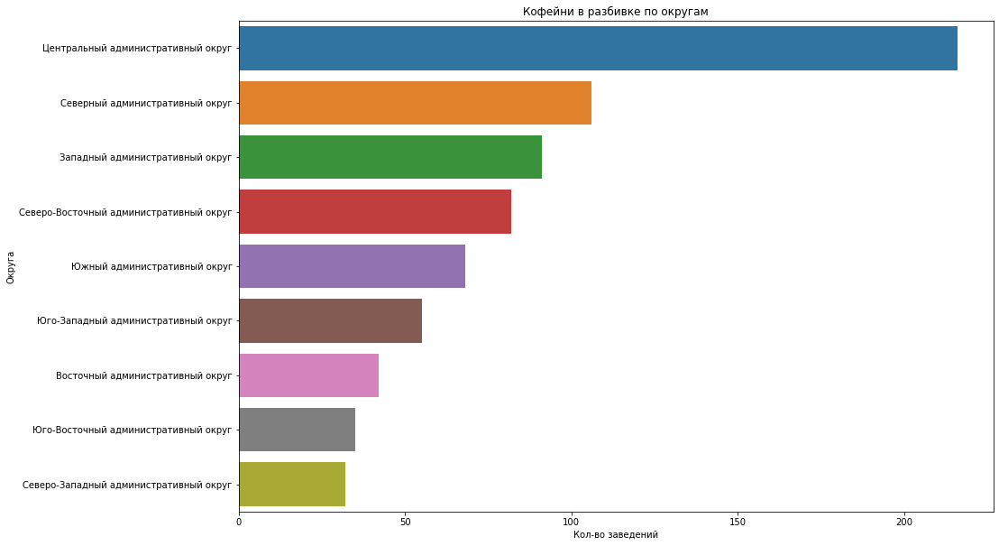

In [47]:
# Строим график
plt.figure(figsize=(15, 10))
ax = sns.barplot(x='id', y='district', data=district_coffe)
ax.set_title('Кофейни в разбивке по округам')
ax.set_xlabel('Кол-во заведений') 
ax.set_ylabel('Округа')
plt.show()

Больше всего заведений в округах:
- Центральный административный округ, 216 заведений
- Северный административный округ, 106 заведений
- Западный административный округ, 91 заведений

Наименьшее количество заведений находится в:
- Восточный административный округ, 42
- Юго-Восточный административный округ, 35
- Северо-Западный административный округ, 32

##### Посмотрим есть ли круглосуточные кофейни

,is_24,id
0,False,692
1,True,35


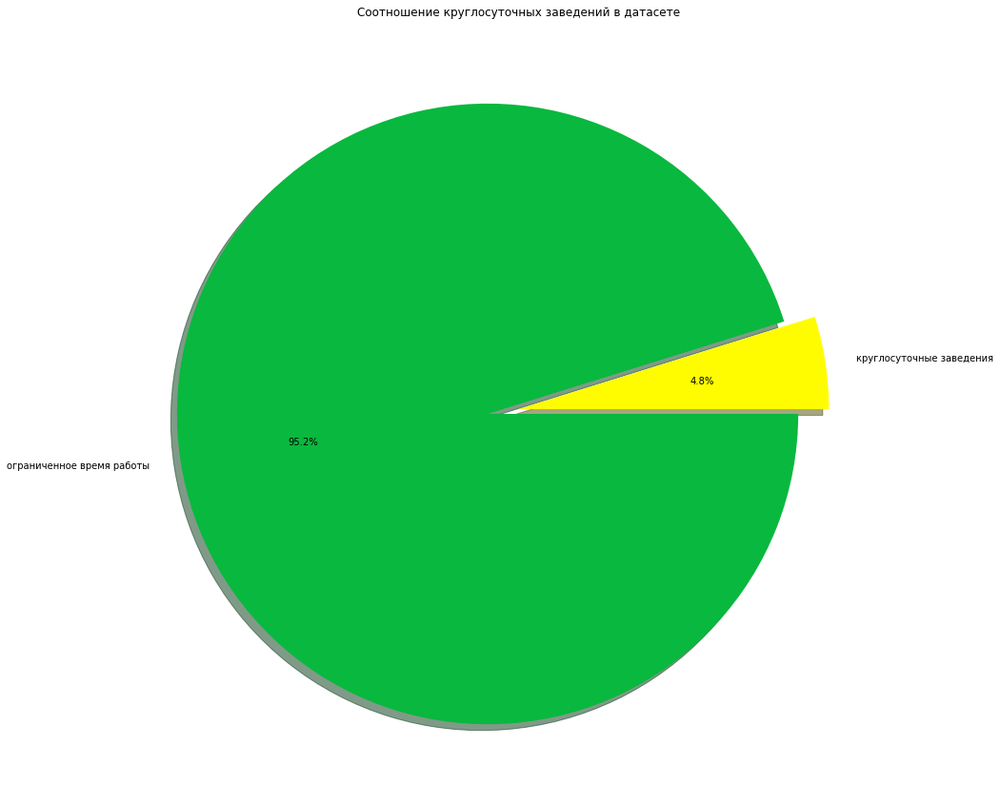

In [48]:
# Группируем кол-во заведений по круглосуточному времени работы
coffe_24 = coffe.groupby('is_24').agg({'id': 'nunique'}).reset_index()
display(coffe_24)

# Строим график
plt.figure(figsize=(15, 15))
colors = ['#09B83E', '#FFFC00']
explode = (0.1, 0)
plt.pie(coffe_24['id'],
        labels=coffe_24['is_24'].map({True: 'круглосуточные заведения', False: 'ограниченное время работы'}), 
        colors=colors,
        explode=explode, 
        autopct='%1.1f%%',
        counterclock=False, 
        shadow=True)
plt.title('Соотношение круглосуточных заведений в датасете')
plt.show()

Круглосуточных заведений - 35 из 727, что составляет 4,8 % от общего количества.

In [49]:
# Создаем список топ 10 круглосуточных кофеин
name_24 = coffe.query('is_24 == True')
top_10 = name_24.groupby('name').agg({'id': 'nunique'}).sort_values(by='id', ascending=False)\
.reset_index().head(10)

# Выводим таблицу
display(top_10)

,name,id
0,Шоколадница,13
1,Кофемания,6
2,Кофе Хауз,2
3,You&coffee,1
4,Столица,1
5,Пирог Хауз,1
6,Кофе с собой,1
7,Кофе On,1
8,Cinnabon,1
9,Cofix,1


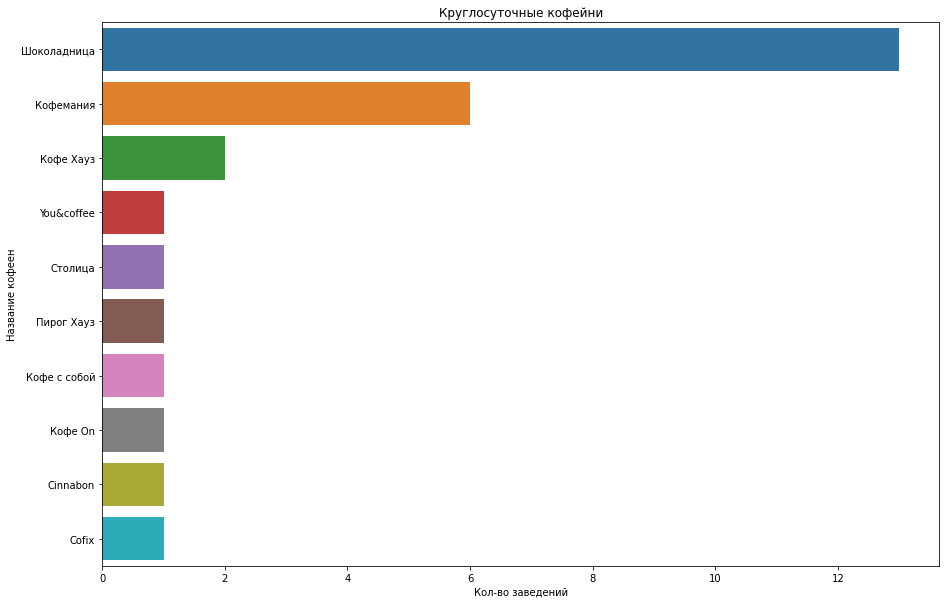

In [50]:
# Строим график
plt.figure(figsize=(15, 10))
ax = sns.barplot(x='id', y='name', data=top_10)
ax.set_title('Круглосуточные кофейни')
ax.set_xlabel('Кол-во заведений') 
ax.set_ylabel('Название кофеен')
plt.show()

Шоколадница лидирует с большим отрывом - 13. Кофемания и Кофе Хауз - 6 и 2 соответственно. Остальные по 1.

In [51]:
# Строим таблицу топ 10 заведений в разрезе по округам
top_10_by_district = name_24.groupby('district').agg(
    {'id': 'nunique'}).sort_values(by='id', ascending=False).reset_index()

# Выводим таблицу
display(top_10_by_district)

,district,id
0,Центральный административный округ,16
1,Западный административный округ,7
2,Юго-Западный административный округ,4
3,Восточный административный округ,3
4,Северный административный округ,3
5,Северо-Восточный административный округ,1
6,Северо-Западный административный округ,1


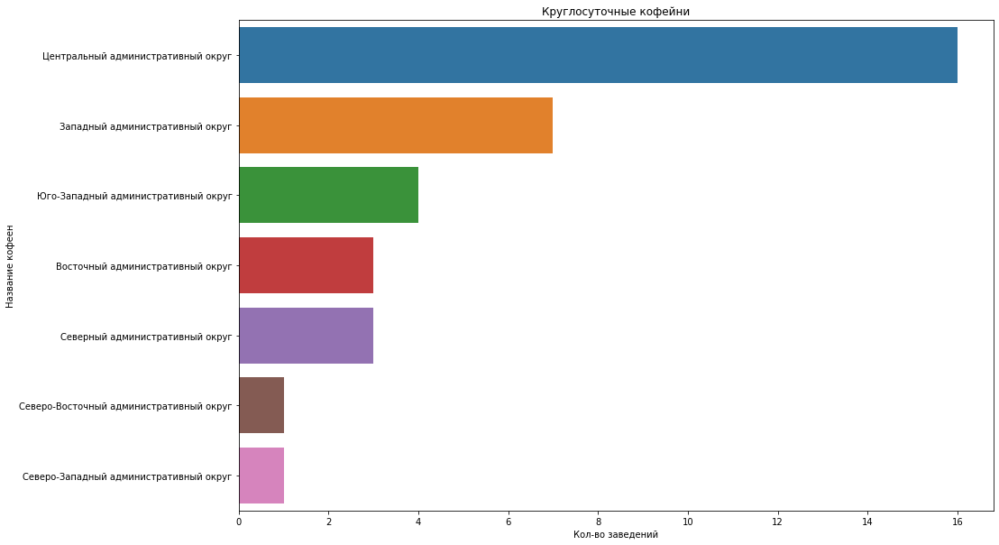

In [52]:
# Строим график
plt.figure(figsize=(15, 10))
ax = sns.barplot(x='id', y='district', data=top_10_by_district)
ax.set_title('Круглосуточные кофейни')
ax.set_xlabel('Кол-во заведений') 
ax.set_ylabel('Название кофеен')
plt.show()

Лидеры по наличию круглосуточных кофеен:
- Центральный административный округ, 16
- Западный административный округ, 7
- Юго-Западный административный округ, 4

Меньше всего кофеен в:
- Северный административный округ, 3
- Северо-Восточный административный округ, 1
- Северо-Западный административный округ, 1

##### Посмотрим какие у кофеен рейтинги и как они распределяются по районам

In [53]:
# Выводим распределение рейтинга
display(coffe['rating'].describe())

count    727.000000
mean       4.284319
std        0.326559
min        2.000000
25%        4.100000
50%        4.300000
75%        4.400000
max        5.000000
Name: rating, dtype: float64

In [54]:
# Строим таблицу рейтинга в разрезе по округам
ra_district = coffe.groupby('district').agg(
    {'rating': 'mean'}).sort_values(by='rating', ascending=False).reset_index()

# Выводим таблицу
display(ra_district)

,district,rating
0,Центральный административный округ,4.342130
1,Юго-Восточный административный округ,4.325714
2,Северный административный округ,4.301887
3,Юго-Западный административный округ,4.290909
4,Восточный административный округ,4.276190
5,Южный административный округ,4.261765
6,Северо-Восточный административный округ,4.259756
7,Северо-Западный административный округ,4.215625
8,Западный административный округ,4.173626


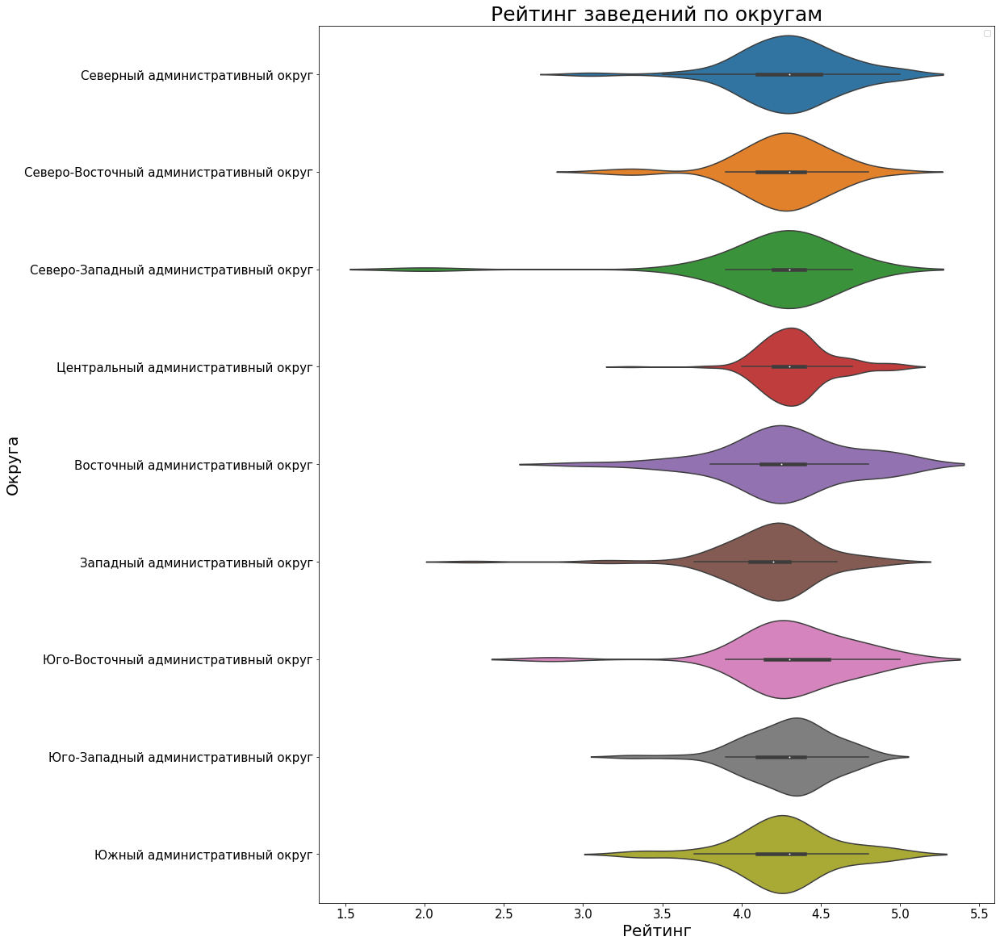

In [55]:
# Строим график
plt.figure(figsize=(15,20))
sns.violinplot(data=coffe, x="rating", y="district", hue="district", dodge=False)
plt.title('Рейтинг заведений по округам', fontsize = 25)
plt.xlabel('Рейтинг', fontsize = 20)
plt.ylabel('Округа', fontsize = 20)
plt.legend('')
plt.yticks(fontsize=15)
plt.xticks(fontsize=15)
plt.show()

- Лучше всех себя показали ЦАО, ЮВАО, ЮАО.
- СЗАО и ЗАО, ВАО имеют большое кол-во выбросов в диапазоне менее 4 балов, что является неблагоприятным показателем.

##### Посмотрим на какую стоимость чашки капучино стоит ориентироваться при открытии и почему

In [56]:
# Сортируем таблицу с средним чеком на капучино больше 0
coffe = coffe.query('middle_coffee_cup > 0')

# Группируем таблицу по среднему чеку в разрезе по округам
mc_district = coffe.groupby('district').agg(
    {'middle_coffee_cup': 'mean'}).sort_values(by='middle_coffee_cup', ascending=False).reset_index()

# Выводим таблицу
display(mc_district)

,district,middle_coffee_cup
0,Восточный административный округ,232.600000
1,Юго-Западный административный округ,199.545455
2,Центральный административный округ,192.192308
3,Западный административный округ,187.428571
4,Южный административный округ,172.040000
5,Северный административный округ,168.836735
6,Северо-Восточный административный округ,166.638889
7,Северо-Западный административный округ,159.818182
8,Юго-Восточный административный округ,136.470588


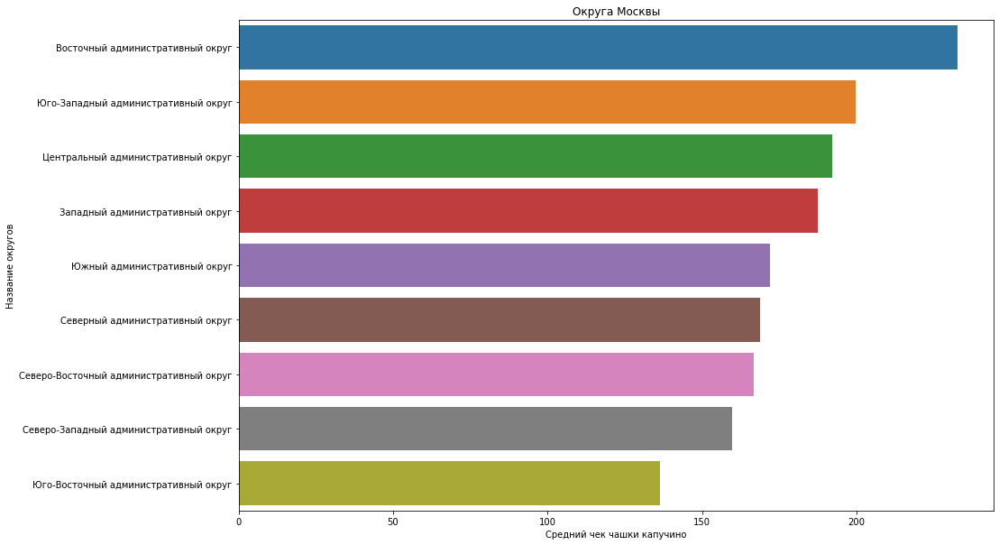

In [57]:
# Строим график
plt.figure(figsize=(15, 10))
ax = sns.barplot(x='middle_coffee_cup', y='district', data=mc_district)
ax.set_title('Округа Москвы')
ax.set_xlabel('Средний чек чашки капучино') 
ax.set_ylabel('Название округов')
plt.show()

- Наивысшая цена находится в ВАО, ЮЗАО и ЦАО. 
- Наименьшая - в СВАО, СЗАО, ЮВАО.

In [58]:
# Посмотрим распределение цены на капучино в ВАО
coffe.query('district == "Восточный административный округ"')['middle_coffee_cup'].describe()

count      15.000000
mean      232.600000
std       373.668646
min        60.000000
25%       105.000000
50%       130.000000
75%       165.000000
max      1568.000000
Name: middle_coffee_cup, dtype: float64

In [59]:
np.percentile(coffe.query('district == "Восточный административный округ"')['middle_coffee_cup'], [90, 95, 99])

array([ 256.  ,  649.6 , 1384.32])

- Средняя цена - 130 руб.
- Медиана - 232 руб.
- 90% капучино ниже 256 руб.

**Вывод:**
- В датасете 727 кофеен

Больше всего заведений в округах:
- Центральный административный округ, 216 заведений
- Северный административный округ, 106 заведений
- Западный административный округ, 91 заведений

Наименьшее количество заведений находится в:
- Восточный административный округ, 42
- Юго-Восточный административный округ, 35
- Северо-Западный административный округ, 32

- Круглосуточных заведений - 35 из 727, что составляет 4,8 % от общего количества. Шоколадница лидирует с большим отрывом - 13. Кофемания и Кофе Хауз - 6 и 2 соответственно. Остальные по 1.

Лидеры по наличию круглосуточных кофеен:
- Центральный административный округ, 16
- Западный административный округ, 7
- Юго-Западный административный округ, 4

Меньше всего кофеен в:
- Северный административный округ, 3
- Северо-Восточный административный округ, 1
- Северо-Западный административный округ, 1

По рейтингу:
- Лучше всех себя показали ЦАО, ЮВАО, ЮАО.
- СЗАО и ЗАО, ВАО имеют большое кол-во выбросов в диапазоне менее 4 балов, что является неблагоприятным показателем.

- Наивысшая цена находится в ВАО, ЮЗАО и ЦАО. 
- Наименьшая - в СВАО, СЗАО, ЮВАО.

#### 5. Общий вывод

По количеству заведений на округ:
- Лидеры: ЦАО (216), САО (106), ЗАО (91)
- Отстающие: ВАО (42), ЮВАО (35), СЗАО (32)

Круглосуточных заведений - 35 из 727, что составляет 4,8 % от общего количества

По наличию круглосуточных кофеен:
- Лидеры: ЦАО (16), ЗАО (7), ЮЗАО (4)
- Меньше всего кофеен в: САО (3), СВАО (1), СЗАО (1)

По рейтингу:
- Лучше всех себя показали ЦАО, ЮВАО, ЮАО.
- СЗАО и ЗАО, ВАО имеют больше всех оценок менее 4 балов, что ниже средней оценки по Москве.

По средней цене за капучино:
- Наивысшая цена находится в ВАО, ЮЗАО и ЦАО.
- Наименьшая - в СВАО, СЗАО, ЮВАО.
---
**Рекомендация для открытия нового заведения:** На мой взгляд Восточный административный округ является перспективным районом по открытию кафе по нескольким причинам:
- 1. Всего в округе 42 заведения, что является одним из минимальных показателей по округам Москвы. Сильной конкуренции в округе не будет.
- 2. Так же ВАО имеет средний показатель количества круглосуточных кофеин - 3.
- 3. Средний рейтинг - 4.26, не самый лучший показатель. Возможно, именно мы можем занять нишу качественного кафе и дать клиентам широкий выбор товаров, чем будем выделяться на фоне конкурентов.
- 4. Максимальный показатель среднего чека (232 рубля). 
- 5. ВАО является лидирующим округом по кол-ву проживающих людей в Москве.

Если сосредоточиться на открытии круглосуточной кофейни в ВАО, можно занять отличную конкурентноспособную нишу кофейни с хорошим показателем среднего чека. 90% заведений продают капучино ниже 256 рублей. Рекомендованная цена продажи находиться между 90 и 95 квартилем. На мой взгляд 300 - 350 рублей - будет оптимально, с учетом минимальной конкуренции в данном округе.

С другой стороны, можно сократить издержки и работать в стандартные часы, продавать качественный продукт и брать аудиторию ценой, чуть ниже среднего. В данном округе она заметно выше.

Рекомендации сильно зависят от множества второстепенных факторов: стратегии развития, маркетинговой политики, наличия ликвидности. Плюс, нужна дополнительная аналитика проходимости конкретной точки и бизнес-план с готовой стратегией. Все вышеперечисленное следует учитывать при принятии окончательного решения.